<a href="https://colab.research.google.com/github/Telomelonia/classification-of-material/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### For Google Colab

In [1]:
pip install pymatgen

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 40.6 MB 1.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 514 kB 31.0 MB/s 
     |████████████████████████████████| 98 kB 6.1 MB/s 
     |████████████████████████████████| 66 kB 4.6 MB/s 
     |████████████████████████████████| 109 kB 20.5 MB/s 
     |████████████████████████████████| 500 kB 50.6 MB/s 
  Created wheel for pymatgen: filename=pymatgen-2022.0.17-cp37-cp37m-linux_x86_64.whl size=41840989 sha256=54ef9093d81ef097d6e0f4b8ecd34bc2c1452c21ce902b5171fad69e3594fe20
  Stored in directory: /root/.cache/pip/wheels/cf/f6/22/58a9be23c5f1b452770e02ff42047175eaf0f9c2f15219fc76
Successfully built pymatgen


### Import Libraries

In [2]:
import pandas as pd
import pymatgen
from pymatgen.ext.matproj import MPRester
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import matplotlib.gridspec as gridspec

### MP API key to be entered

In [3]:
mpr = MPRester('rysf21mRNDpBgzXn')

### Create Database with properties of stable insulator.

In [4]:
criteria = {'e_above_hull': {'$lte': 0.02},'band_gap':{'$gt':0}}

props = ['pretty_formula', 'band_gap', 'density', 'formation_energy_per_atom', 'volume']
entries = mpr.query(criteria=criteria, properties=props)

df_insulators = pd.DataFrame(entries)

 39%|███▉      | 11000/28257 [00:15<00:15, 1115.47it/s]

Unknown server error. Trying again in five seconds (will try at most 5 times)...


100%|██████████| 28257/28257 [00:37<00:00, 763.16it/s]


In [5]:
df_insulators.describe()

,band_gap,density,formation_energy_per_atom,volume
count,28257.000000,28257.000000,28257.000000,28257.000000
mean,2.522133,4.412158,-2.002483,666.203488
std,1.655530,1.725556,0.988959,627.317021
min,0.000100,0.023670,-9.716534,12.643690
25%,1.216600,3.157021,-2.757067,271.534823
50%,2.337600,4.127076,-2.099896,484.190292
75%,3.627800,5.426218,-1.207769,851.092611
max,17.902300,13.941773,0.018960,7131.810149


### Create Database with properties of stable Conductor.

In [6]:
criteria = {'e_above_hull': {'$lte': 0.02},'band_gap':{'$eq':0}}

props = ['pretty_formula', 'band_gap', "density",
         'formation_energy_per_atom', 'volume']
entries = mpr.query(criteria=criteria, properties=props)

df_conductors = pd.DataFrame(entries)


100%|██████████| 23935/23935 [00:21<00:00, 1103.58it/s]


In [7]:
df_conductors.describe()

,band_gap,density,formation_energy_per_atom,volume
count,23935.0,23935.000000,23935.000000,23935.000000
mean,0.0,7.938372,-0.791726,314.006158
std,0.0,2.914909,0.745928,386.954045
min,0.0,0.241653,-7.104784,6.730622
25%,0.0,5.960552,-0.881489,97.610363
50%,0.0,7.762597,-0.562276,187.535858
75%,0.0,9.473863,-0.335850,373.307839
max,0.0,22.754912,0.720667,6583.404738


In [8]:
fig = plt.figure(1, figsize=(18,6))
gs = gridspec.GridSpec(3,1)
gs.update(wspace=0.2, hspace=0.25)


<Figure size 1296x432 with 0 Axes>

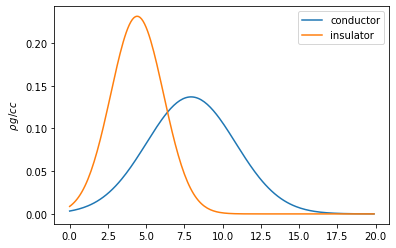

In [9]:
xtr_subsplot= fig.add_subplot(gs[0:1,0:1])
x=np.arange(0,20,0.1)
y_conductor=scipy.stats.norm(df_conductors['density'].mean(), df_conductors['density'].std()).pdf(x) #probability distribution function
y_ins=scipy.stats.norm(df_insulators['density'].mean(), df_insulators['density'].std()).pdf(x) #probability distribution function
plt.plot(x,y_conductor,label='conductor')
plt.plot(x,y_ins,label='insulator')
plt.ylabel(r'$\rho\,g/cc$')
plt.legend()

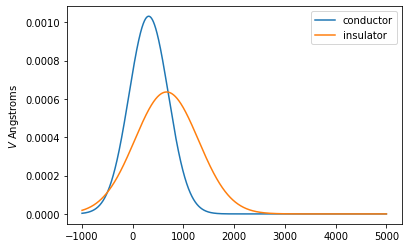

In [10]:
xtr_subsplot= fig.add_subplot(gs[1:2,0:1])
x=np.arange(-1000,5000,0.1)
y_conductor=scipy.stats.norm(df_conductors['volume'].mean(), df_conductors['volume'].std()).pdf(x) #probability distribution function
y_ins=scipy.stats.norm(df_insulators['volume'].mean(), df_insulators['volume'].std()).pdf(x) #probability distribution function
plt.plot(x,y_conductor,label='conductor')
plt.plot(x,y_ins,label='insulator')
plt.ylabel('$V$ Angstroms')
plt.legend()

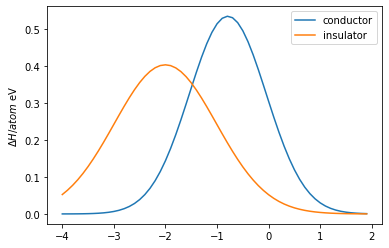

In [11]:
xtr_subsplot= fig.add_subplot(gs[2:3,0:1])
x=np.arange(-4,2,0.1)
y_conductor=scipy.stats.norm(df_conductors['formation_energy_per_atom'].mean(), df_conductors['formation_energy_per_atom'].std()).pdf(x) #probability distribution function
y_ins=scipy.stats.norm(df_insulators['formation_energy_per_atom'].mean(), df_insulators['formation_energy_per_atom'].std()).pdf(x) #probability distribution function
plt.plot(x,y_conductor,label='conductor')
plt.plot(x,y_ins,label='insulator')
plt.ylabel('$\Delta H/atom$ eV')

plt.legend()

### For an instance taking database of all mono oxide for the project

> Note: Can be used for any hypothetical material also.

In [12]:
properties = ['density', 'formation_energy_per_atom', 'volume']
data = mpr.query('*O',properties=properties)
# but the problem is we are missing some mono oxides like potassium mono oxide or 
# any mono oxide with multiple sharing atom(/cation in some case)
# for that we iterate for *i i from 2 to 8 and add those results to main result
for i in range(2,9):
    data += mpr.query(('*'+str(i)+'O'),properties = properties)

/usr/local/lib/python3.7/dist-packages/pymatgen/core/periodic_table.py:216: UserWarning: No electronegativity for He. Setting to NaN. This has no physical meaning, and is mainly done to avoid errors caused by the code expecting a float.
  "avoid errors caused by the code expecting a float." % self.symbol
/usr/local/lib/python3.7/dist-packages/pymatgen/core/periodic_table.py:216: UserWarning: No electronegativity for Ne. Setting to NaN. This has no physical meaning, and is mainly done to avoid errors caused by the code expecting a float.
  "avoid errors caused by the code expecting a float." % self.symbol
/usr/local/lib/python3.7/dist-packages/pymatgen/core/periodic_table.py:216: UserWarning: No electronegativity for Ar. Setting to NaN. This has no physical meaning, and is mainly done to avoid errors caused by the code expecting a float.
  "avoid errors caused by the code expecting a float." % self.symbol
/usr/local/lib/python3.7/dist-packages/pymatgen/core/periodic_table.py:216: UserWa

In [13]:
data[0]

{'density': 6.3241740485333695,
 'formation_energy_per_atom': -0.1462502022916672,
 'volume': 32.52392918150042}

In [62]:
len(data)

354

### Data Cleaning 

In [14]:
null_den, null_form, null_vol = 0, 0, 0
for i in range(len(data)):
  if(data[i]['density'] == None):
    null_den+=1
  if(data[i]['volume'] == None):
    null_vol+=1
  if(data[i]['formation_energy_per_atom'] == None):
    null_form+=1
print("Null density entries are :", null_den)
print("Null volume entries are :", null_vol)
print("Null formation energy entries are :", null_form)

Null density entries are : 0
Null volume entries are : 0
Null formation energy entries are : 0


> NOTE:
-  No Requirement of Cleaning as no null values are there.
-  No Scaling Required for classification. 

### Calculating Probability and odds for material to be 

In [15]:
for i in range(len(data)):
  prior_conductor = df_conductors['density'].count()/(df_insulators['density'].count()+df_conductors['density'].count())
  prior_insulators = 1-prior_conductor

  #now probability based on density
  density_conductor = scipy.stats.norm(df_conductors['density'].mean(), df_conductors['density'].std()).pdf(data[i]['density'])
  density_insulators = scipy.stats.norm(df_insulators['density'].mean(), df_insulators['density'].std()).pdf(data[i]['density'])

  #now probability based on volume
  volume_conductor = scipy.stats.norm(df_conductors['volume'].mean(), df_conductors['volume'].std()).pdf(data[i]['volume'])
  volume_insulators = scipy.stats.norm(df_insulators['volume'].mean(), df_insulators['volume'].std()).pdf(data[i]['volume'])

  #now probability based on formation energy
  energy_conductor = scipy.stats.norm(df_conductors['formation_energy_per_atom'].mean(), df_conductors['formation_energy_per_atom'].std()).pdf(data[i]['formation_energy_per_atom'])
  energy_insulators = scipy.stats.norm(df_insulators['formation_energy_per_atom'].mean(), df_insulators['formation_energy_per_atom'].std()).pdf(data[i]['formation_energy_per_atom'])

  #now we add up the log of these probabilities and compare
  odds_of_conductor = np.log(prior_conductor)+np.log(density_conductor)+np.log(volume_conductor)+np.log(energy_conductor)
  odds_of_insulator = np.log(prior_insulators)+np.log(density_insulators)+np.log(volume_insulators)+np.log(energy_insulators)
  data[i]['odds_of_conductor'] = odds_of_conductor
  data[i]['odds_of_insulator'] = odds_of_insulator
  
  #1 for conductor
  #0 for insulator

  if odds_of_conductor > odds_of_insulator:
      data[i]['material'] = 1
  else:
      data[i]['material'] = 0


In [16]:
df = pd.DataFrame(data)

In [17]:
df.describe()

,density,formation_energy_per_atom,volume,odds_of_conductor,odds_of_insulator,material
count,354.000000,354.000000,354.000000,354.000000,354.000000,354.000000
mean,4.931313,-1.462001,349.473063,-13.671795,-13.181356,0.347458
std,3.099844,1.039338,528.058109,3.269365,4.361269,0.476837
min,0.370704,-3.636993,12.149229,-32.129156,-47.227573,0.000000
25%,2.542408,-2.089548,58.736937,-15.260355,-13.233167,0.000000
50%,4.595675,-1.387762,111.717710,-12.687509,-11.839846,0.000000
75%,5.979592,-0.787525,300.444956,-11.536958,-11.225495,1.000000
max,18.387812,2.403340,2645.174521,-10.406695,-10.617026,1.000000


### Scatter plots for the material database taken as per query.

In [18]:
fig = plt.figure(figsize=(18,6), dpi=1600) 
alpha=alpha_scatterplot = 0.2 
plt.subplot2grid((2,3),(0,0))
plt.scatter(df.material, df.density, alpha=alpha_scatterplot, color = '#00008B')
plt.title("Material vs Density,  (1 = Conductor)&(0 = Insulator)")
# sets the y axis lable
plt.ylabel("Density")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')  
plt.subplot2grid((2,3),(0,1))
plt.scatter(df.odds_of_conductor, df.density, alpha=alpha_scatterplot, color = '#F5540C')
plt.title("Odds for Conductor vs Density")
# sets the y axis lable
plt.ylabel("Density")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')  
plt.subplot2grid((2,3),(1,0))
plt.scatter(df.odds_of_insulator, df.density, alpha=alpha_scatterplot, color = '#00F700')
plt.title("Odds for Insulator vs Density")
# sets the y axis lable
plt.ylabel("Density")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')

In [19]:
fig = plt.figure(figsize=(18,6), dpi=1600) 
alpha=alpha_scatterplot = 0.2 
plt.subplot2grid((2,3),(0,0))
plt.scatter(df.material, df.volume, alpha=alpha_scatterplot, color = '#00008B')
plt.title("Material vs Volume,  (1 = Conductor)&(0 = Insulator)")
# sets the y axis lable
plt.ylabel("volume")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')  
plt.subplot2grid((2,3),(0,1))
plt.scatter(df.odds_of_conductor, df.volume, alpha=alpha_scatterplot, color = '#F5540C')
plt.title("Odds for Conductor vs volume")
# sets the y axis lable
plt.ylabel("volume")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')  
plt.subplot2grid((2,3),(1,0))
plt.scatter(df.odds_of_insulator, df.volume, alpha=alpha_scatterplot, color = '#00F700')
plt.title("Odds for Insulator vs volume")
# sets the y axis lable
plt.ylabel("volume")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')

In [20]:
fig = plt.figure(figsize=(18,6), dpi=1600) 
alpha=alpha_scatterplot = 0.2 
plt.subplot2grid((2,3),(0,0))
plt.scatter(df.material, df.formation_energy_per_atom, alpha=alpha_scatterplot, color = '#00008B')
plt.title("Material vs formation_energy_per_atom,  (1 = Conductor)&(0 = Insulator)")
# sets the y axis lable
plt.ylabel("formation_energy_per_atom")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')  
plt.subplot2grid((2,3),(0,1))
plt.scatter(df.odds_of_conductor, df.formation_energy_per_atom, alpha=alpha_scatterplot, color = '#F5540C')
plt.title("Odds for Conductor vs formation_energy_per_atom")
# sets the y axis lable
plt.ylabel("formation_energy_per_atom")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')  
plt.subplot2grid((2,3),(1,0))
plt.scatter(df.odds_of_insulator, df.formation_energy_per_atom, alpha=alpha_scatterplot, color = '#00F700')
plt.title("Odds for Insulator vs formation_energy_per_atom")
# sets the y axis lable
plt.ylabel("formation_energy_per_atom")
# formats the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')

In [44]:
df = df.drop(['odds_of_conductor', 'odds_of_insulator'], axis=1)

### Correlation Matrix

In [45]:
df.corr()

,density,formation_energy_per_atom,volume,material
density,1.000000,0.126596,-0.209637,0.493771
formation_energy_per_atom,0.126596,1.000000,-0.169199,0.602544
volume,-0.209637,-0.169199,1.000000,-0.327687
material,0.493771,0.602544,-0.327687,1.000000


In [46]:
df.corr()['material'].abs().sort_values(ascending=False)

material                     1.000000
formation_energy_per_atom    0.602544
density                      0.493771
volume                       0.327687
Name: material, dtype: float64

## Time to create model

In [64]:
scores = {}

### Splitting

In [47]:
from sklearn.model_selection import train_test_split
predictors = df.drop('material',axis=1) 
target = df['material']
X_train,X_test,y_train,y_test = train_test_split(predictors,target,test_size=0.20,random_state=0)

### Training

In [65]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)
  
# making predictions on the testing set
y_pred = gnb.predict(X_test)

In [66]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred))
scores['guassian'] = accuracy_score(y_test, y_pred)

0.8873239436619719


### Confusion matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


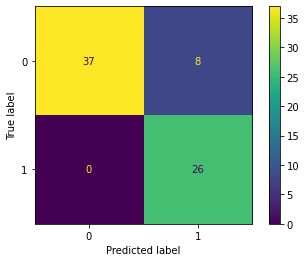

In [67]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(gnb, X_test, y_test) 
plt.show()

### Classification Report

In [68]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.82      0.90        45
           1       0.76      1.00      0.87        26

    accuracy                           0.89        71
   macro avg       0.88      0.91      0.88        71
weighted avg       0.91      0.89      0.89        71



### Other Classifier for reference

#### Logistic Regression

In [69]:
from sklearn.linear_model import LogisticRegression
log = LogisticRegression()
log.fit(X_train, y_train)
# making predictions on the testing set
y_pred = log.predict(X_test)
from sklearn.metrics import accuracy_score
print("Accuracy :",accuracy_score(y_test, y_pred))
scores['logistic'] = accuracy_score(y_test, y_pred)

Accuracy : 0.9859154929577465


Confusion matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


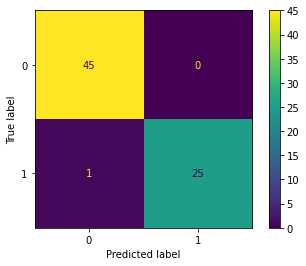

In [70]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(log, X_test, y_test) 
plt.show()

Classification Report

In [71]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        45
           1       1.00      0.96      0.98        26

    accuracy                           0.99        71
   macro avg       0.99      0.98      0.98        71
weighted avg       0.99      0.99      0.99        71



#### K-nn Classifier

In [72]:
from sklearn.neighbors import KNeighborsClassifier  
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
# making predictions on the testing set
y_pred = knn.predict(X_test)
from sklearn.metrics import accuracy_score
print("Accuracy :",accuracy_score(y_test, y_pred))
scores['k-nn'] = accuracy_score(y_test, y_pred)

Accuracy : 0.7746478873239436


Confusion matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


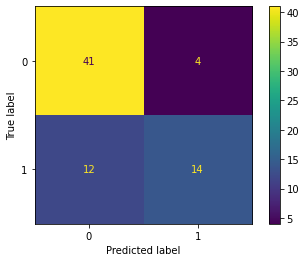

In [73]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(knn, X_test, y_test) 
plt.show()

Classification Report

In [74]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.91      0.84        45
           1       0.78      0.54      0.64        26

    accuracy                           0.77        71
   macro avg       0.78      0.72      0.74        71
weighted avg       0.78      0.77      0.76        71



#### Decision Tree Classifier

In [75]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)
# making predictions on the testing set
y_pred = dt.predict(X_test)
from sklearn.metrics import accuracy_score
print("Accuracy :",accuracy_score(y_test, y_pred))
scores['Decision Tree'] = accuracy_score(y_test, y_pred)

Accuracy : 0.9577464788732394


Confusion Matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


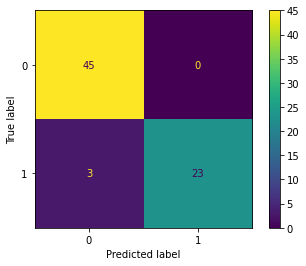

In [76]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dt, X_test, y_test) 
plt.show()

Classification Report

In [77]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97        45
           1       1.00      0.88      0.94        26

    accuracy                           0.96        71
   macro avg       0.97      0.94      0.95        71
weighted avg       0.96      0.96      0.96        71



/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


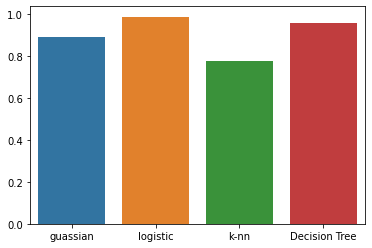

In [78]:
import seaborn as sns

sns.barplot(list(scores.keys()), list(scores.values()))

### **Result**

*   Best model to classify is : Logistic Regression
*   Accuracy : 0.9859154929577465

